# Traffic Object Detection Results Analysis - Dhaka, Bangladesh

## 1. Introduction
In this notebook, we analyze the object detection performance on urban traffic data using three models: a pretrained YOLO model, a custom-trained YOLO model, and a custom-trained YOLO model with data augmentation. The objective is to assess how well each model detects traffic objects across images and video frames, and compare their effectiveness through key evaluation metrics.

Let's get ready by importing the packages we need.

In [1]:
import sys
from collections import Counter
from pathlib import Path
import subprocess
import contextlib
import PIL
import torch
import torchvision
import ultralytics
from tqdm import tqdm
from IPython.display import Video
from PIL import Image
from IPython.display import Image
from torchvision import transforms
from torchvision.io import read_image
from torchvision.utils import make_grid
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
print("Platform:", sys.platform)
print("Python version:", sys.version)
print("---")
print("PIL version : ", PIL.__version__)
print("torch version : ", torch.__version__)
print("torchvision version : ", torchvision.__version__)
print("ultralytics version : ", ultralytics.__version__)

Platform: linux
Python version: 3.11.0 (main, Nov 15 2022, 20:12:54) [GCC 10.2.1 20210110]
---
PIL version :  10.2.0
torch version :  2.2.2+cu121
torchvision version :  0.17.2+cu121
ultralytics version :  8.3.27


In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(f"Using {device} device.")

Using cuda device.


## 2. Pretrained Baseline Performance

We start by running a pretrained YOLO model (YOLOv8n trained on COCO classes) on our dataset without any fine-tuning. This serves as a baseline to compare against our custom-trained models. We will analyze its predictions on both images and videos.

In [4]:
yolo_baseline = YOLO(task="detect", model="yolov8n.pt").to(device)

### 2.1 COCO Classes Overview
The COCO dataset, which contains a broad range of object categories. These categories, such as cars, buses, and people, are highly relevant in traffic scenarios but may not cover all the unique classes specific to Dhaka's traffic environment. What classes can this pretrained baseline model detect? Let's check it out.

In [5]:
yolo_baseline.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

### 2.2 Using YOLO Base Model on Single Image

By applying the base model to an image, we can quickly observe how well the model detects individual objects in a real-world traffic scenario. 

In [6]:
data_dir = Path("data_images", "test")
image_path = data_dir / "Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg"

Let's visualize the image before we perform object detect detection.

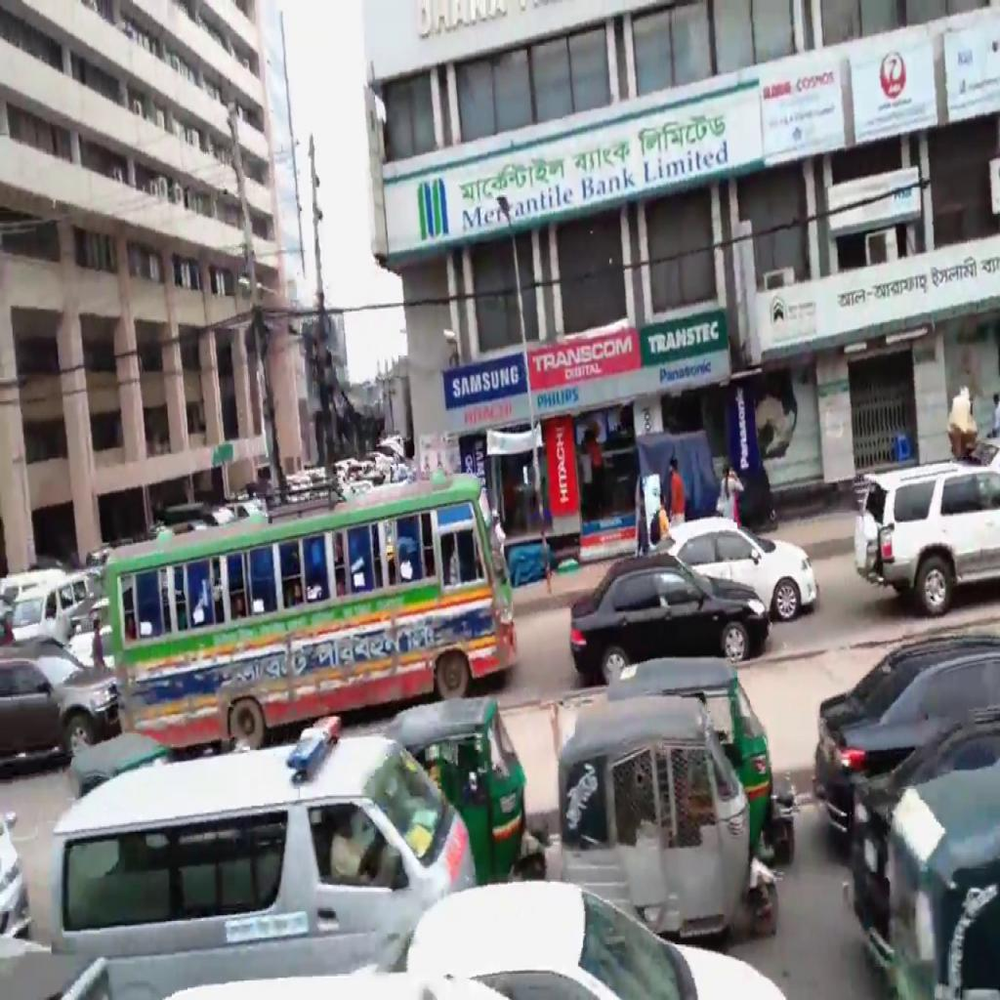

In [7]:
from PIL import Image
Image.open(data_dir / "Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg")

In [8]:
results_baseline_image = yolo_baseline.predict(image_path, conf=0.5, save=True, save_txt=True)


image 1/1 /app/data_images/test/Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg: 640x640 8 cars, 1 bus, 61.3ms
Speed: 3.5ms preprocess, 61.3ms inference, 186.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


In [9]:
print(f"Number of objects detected: {len(results_baseline_image[0].boxes.cls)}")

Number of objects detected: 9


In [10]:
object_counts = Counter([yolo_baseline.names[int(cls)] for cls in results_baseline_image[0].boxes.cls])
object_counts

Counter({'car': 8, 'bus': 1})

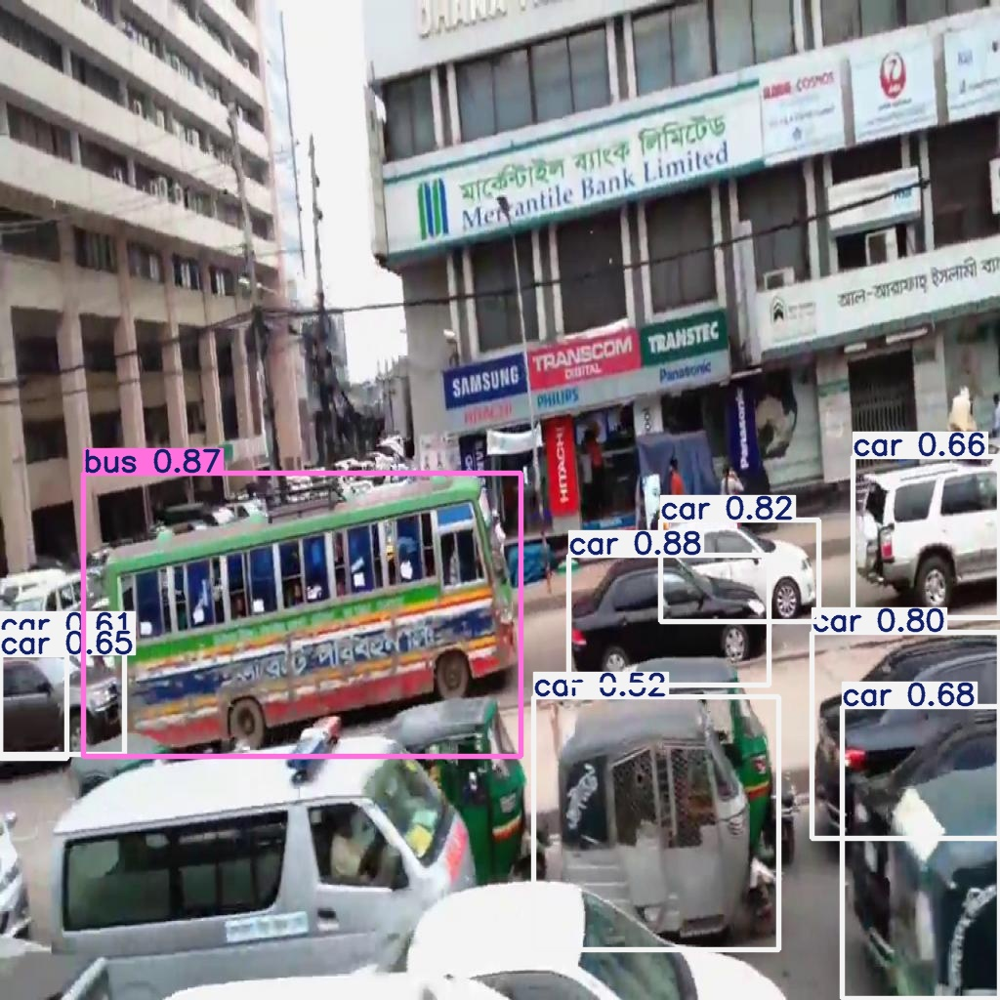

In [11]:
location_of_results = Path(results_baseline_image[0].save_dir)
location_of_results.exists()
Image.open(location_of_results / "Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg")

### 2.3 Using YOLO Base Model on Multiple Images
Traffic analysis often involves detecting objects over time, especially when considering videos or real-time monitoring. By detecting objects across multiple frames, we can assess the model’s consistency and ability to track objects in a dynamic traffic environment.

In [12]:
def display_sample_images(dir_path, sample=5):
    dir_path = Path(dir_path) if isinstance(dir_path, str) else dir_path

    image_list = []
    # Sort the images to ensure they are processed in order
    images = sorted(dir_path.glob("*.jpg"))
    if not images:
        return None

    # Iterate over the first 'sample' images
    for img_path in images[:sample]:
        img = read_image(str(img_path))
        resize_transform = transforms.Resize((240, 240))
        img = resize_transform(img)
        image_list.append(img)

    # Organize the grid to have 'sample' images per row
    Grid = make_grid(image_list, nrow=5)
    # Convert the tensor grid to a PIL Image for display
    img = torchvision.transforms.ToPILImage()(Grid)
    return img

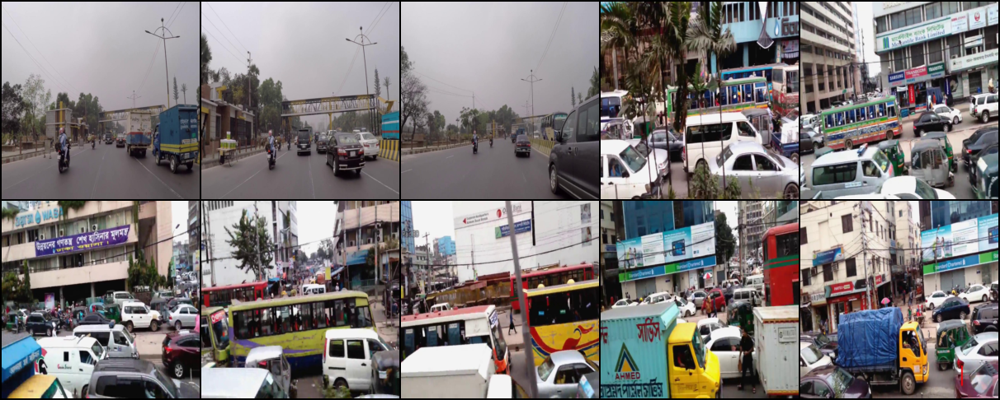

In [13]:
# Display the first ten images
display_sample_images(data_dir, sample=10)

In [14]:
images_path = list(data_dir.iterdir())[:10]

In [15]:
results_baseline_images = yolo_baseline.predict(
    images_path,
    conf=0.5,
    save=True,
    save_txt=True,
    project=Path("runs", "detect"),
    name="baseline_images",
)


0: 640x640 3 cars, 3 buss, 16.7ms
1: 640x640 2 cars, 16.7ms
2: 640x640 2 cars, 16.7ms
3: 640x640 2 cars, 1 train, 16.7ms
4: 640x640 1 person, 3 cars, 1 truck, 16.7ms
5: 640x640 2 cars, 16.7ms
6: 640x640 2 cars, 16.7ms
7: 640x640 1 bus, 16.7ms
8: 640x640 1 person, 4 cars, 16.7ms
9: 640x640 1 car, 16.7ms
Speed: 3.8ms preprocess, 16.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/baseline_images
10 labels saved to runs/detect/baseline_images/labels


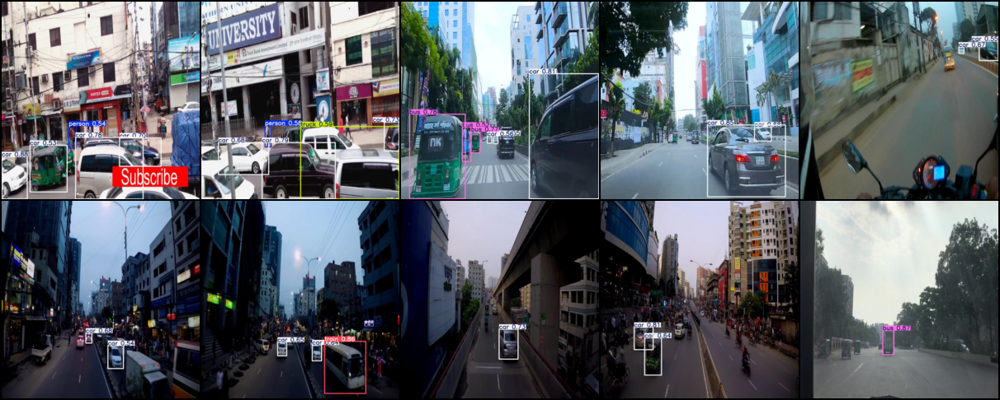

In [16]:
image = display_sample_images(results_baseline_images[0].save_dir, sample=25)
image

After evaluating the baseline model, a major limitation becomes evident: the pretrained YOLOv8 model is not designed to detect Dhaka-specific traffic objects. It lacks the ability to recognize custom classes such as rickshaws, SUVs, and local three-wheelers (CNGs). As a result, the model often fails to detect these objects entirely or misclassifies them as generic categories like "car" or "bus," leading to reduced detection accuracy. This highlights the need for model customization and fine-tuning to enhance its effectiveness in Dhaka’s unique traffic environment.

## 3. Custom Model Evaluation

Next, we evaluate the custom-trained YOLO model, which has been specifically trained on our dataset with the key object classes. The goal is to see whether this fine-tuned model improves object detection over the baseline model.

In [17]:
yolo_custom_no_aug = YOLO(task="detect", model="yolo_custom_no_aug.pt").to(device)


### 3.1 Custom Classes Overview
In contrast to the COCO dataset, the custom-trained model includes traffic-specific classes tailored to Dhaka's unique environment.

In [18]:
yolo_custom_no_aug.names

{0: 'ambulance',
 1: 'army vehicle',
 2: 'auto rickshaw',
 3: 'bicycle',
 4: 'bus',
 5: 'car',
 6: 'garbagevan',
 7: 'human hauler',
 8: 'minibus',
 9: 'minivan',
 10: 'motorbike',
 11: 'pickup',
 12: 'policecar',
 13: 'rickshaw',
 14: 'scooter',
 15: 'suv',
 16: 'taxi',
 17: 'three wheelers (CNG)',
 18: 'truck',
 19: 'van',
 20: 'wheelbarrow'}

### 3.2 Using Custom Model on Single Image

In [19]:
results_custom_no_aug_image = yolo_custom_no_aug.predict(image_path, conf=0.5, save=True, save_txt=True)



image 1/1 /app/data_images/test/Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg: 640x640 1 bus, 4 cars, 1 suv, 2 three wheelers (CNG)s, 1 van, 68.8ms
Speed: 4.6ms preprocess, 68.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
1 label saved to runs/detect/predict2/labels


In [20]:
location_of_results = Path(results_custom_no_aug_image[0].save_dir)
location_of_results.exists()

True

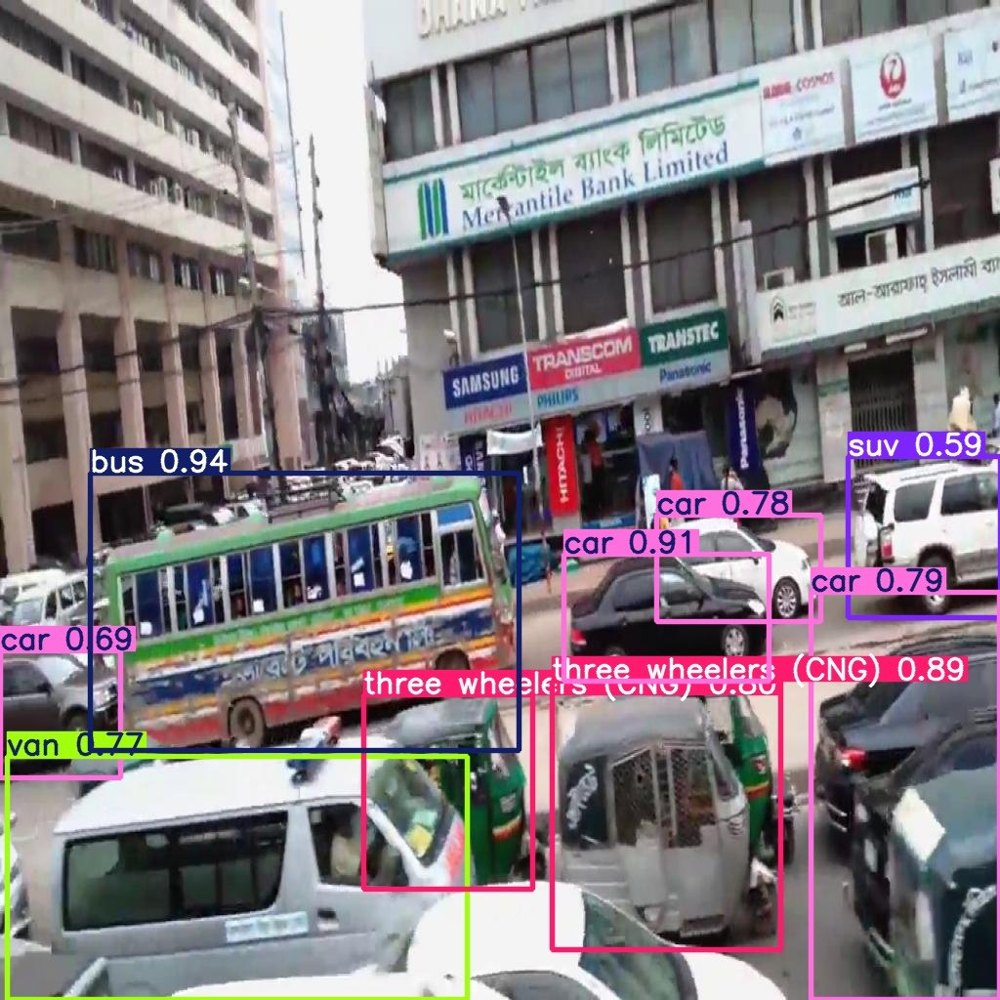

In [21]:
Image.open(location_of_results / "Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg")

### 3.3 Using Custom Model on Multiple Images

In [22]:
results_custom_no_aug_images = yolo_custom_no_aug.predict(
    images_path,
    conf=0.5,
    save=True,
    save_txt=True,
    project=Path("runs", "detect"),
    name="custom_no_aug_images",
)


0: 640x640 1 car, 1 three wheelers (CNG), 9.4ms
1: 640x640 2 bicycles, 1 car, 2 motorbikes, 1 rickshaw, 2 three wheelers (CNG)s, 9.4ms
2: 640x640 1 car, 1 three wheelers (CNG), 9.4ms
3: 640x640 2 buss, 1 car, 1 three wheelers (CNG), 9.4ms
4: 640x640 1 car, 1 suv, 1 van, 9.4ms
5: 640x640 1 bus, 3 cars, 1 pickup, 2 three wheelers (CNG)s, 9.4ms
6: 640x640 1 bus, 2 motorbikes, 9.4ms
7: 640x640 1 bus, 2 three wheelers (CNG)s, 9.4ms
8: 640x640 1 car, 2 three wheelers (CNG)s, 9.4ms
9: 640x640 1 bus, 1 car, 9.4ms
Speed: 3.8ms preprocess, 9.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/custom_no_aug_images
10 labels saved to runs/detect/custom_no_aug_images/labels


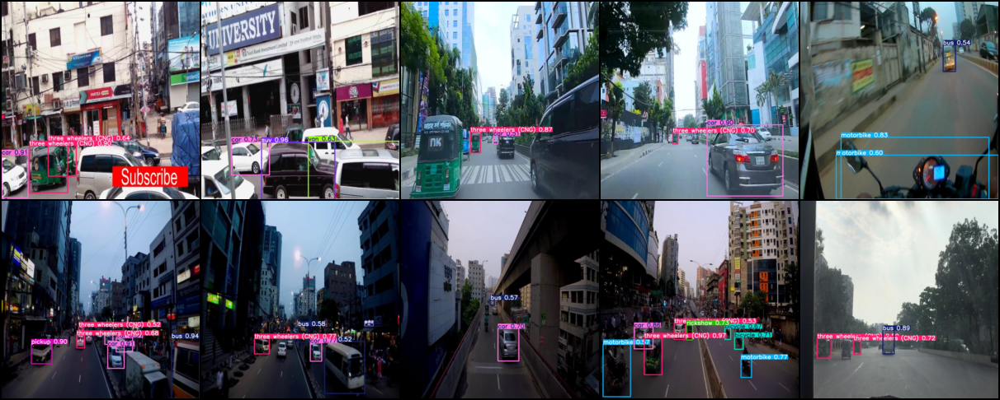

In [23]:
image = display_sample_images(results_custom_no_aug_images[0].save_dir, sample=10)
image

The custom-trained model, performs well in detecting specific traffic objects relevant to Dhaka, such as rickshaws and SUVs, surpassing the baseline model in terms of accuracy for these classes. However, one notable shortcoming of the model is its poor performance on imbalanced classes and small objects. The model struggles to detect these objects accurately, likely due to the limited representation of such objects in the training data. To address this issue, data augmentation techniques play a crucial role in improving the model's robustness by artificially increasing the variety and representation of small or less frequent objects, helping the model generalize better to these challenging cases.

### 3.4 Training Performance Analyais (Custom Model)

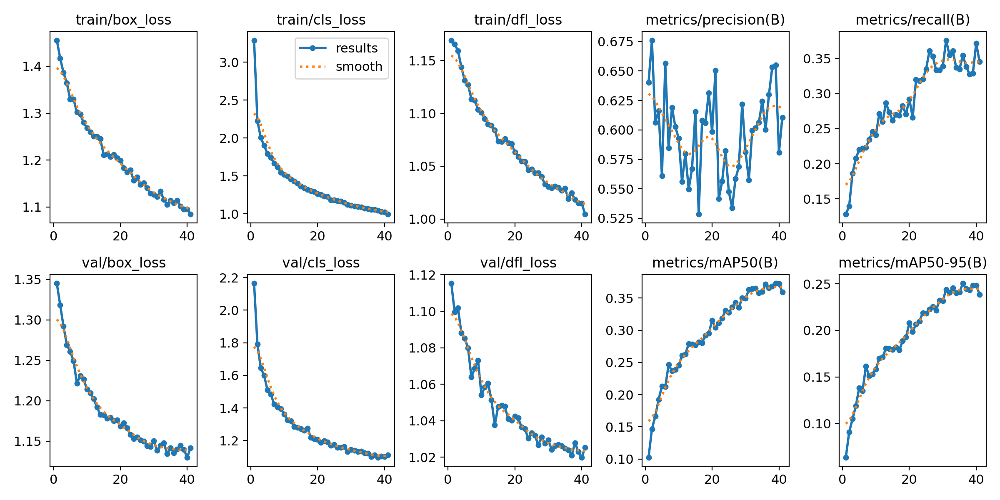

In [24]:
from IPython.display import Image
Image(filename='results.png')


The custom model shows effective learning with steadily decreasing training and validation losses (box_loss, cls_loss, dfl_loss), indicating minimal overfitting. The model demonstrates improved object localization (box_loss) and classification accuracy (cls_loss), as seen in the rising mAP50 and mAP50-95 scores. However, precision fluctuates more than recall, suggesting potential for further optimization to enhance precision-recall balance. Fine-tuning to stabilize precision could enhance overall performance. In conclusion, the model demonstrates strong learning but has room for improvement in precision.


## 4. Augmented Custom Model Analysis

In [25]:
yolo_custom_aug = YOLO(task="detect", model="yolo_custom_aug.pt").to(device)

### 4.1 Using Augmented Custom Model on Single Image

In [26]:
results_custom_aug_image = yolo_custom_aug.predict(image_path, conf=0.5, save=True, save_txt=True)


image 1/1 /app/data_images/test/Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg: 640x640 1 bus, 6 cars, 2 three wheelers (CNG)s, 51.1ms
Speed: 3.4ms preprocess, 51.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3
1 label saved to runs/detect/predict3/labels


In [27]:
location_of_results = Path(results_custom_aug_image[0].save_dir)
location_of_results.exists()

True

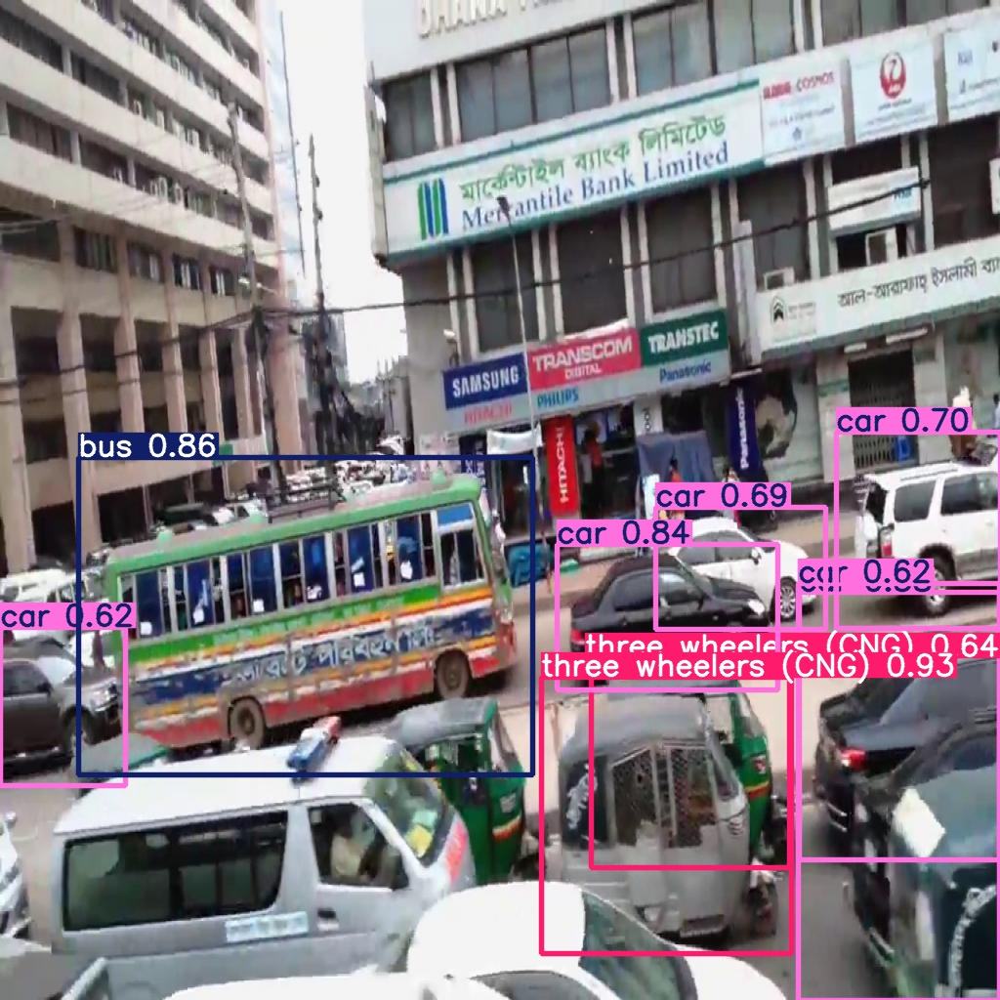

In [28]:
from PIL import Image
Image.open(location_of_results / "Sabiha_(10)_jpg.rf.d163e2a53d5ed22112e9ead62807acf4.jpg")

### 4.2 Using Augmented Custom Model on Multiple Images

In [29]:
yolo_custom_aug_images = yolo_custom_aug.predict(
    images_path,
    conf=0.5,
    save=True,
    save_txt=True,
    project=Path("runs", "detect"),
    name="custom_aug_images",
)


0: 640x640 1 bus, 1 car, 3 three wheelers (CNG)s, 8.9ms
1: 640x640 1 car, 1 three wheelers (CNG), 8.9ms
2: 640x640 2 cars, 3 three wheelers (CNG)s, 8.9ms
3: 640x640 1 bus, 2 cars, 1 three wheelers (CNG), 8.9ms
4: 640x640 3 cars, 1 three wheelers (CNG), 8.9ms
5: 640x640 1 car, 1 three wheelers (CNG), 8.9ms
6: 640x640 2 motorbikes, 1 suv, 1 three wheelers (CNG), 8.9ms
7: 640x640 1 bus, 4 three wheelers (CNG)s, 8.9ms
8: 640x640 2 cars, 3 three wheelers (CNG)s, 8.9ms
9: 640x640 1 car, 1 three wheelers (CNG), 8.9ms
Speed: 3.8ms preprocess, 8.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/custom_aug_images
10 labels saved to runs/detect/custom_aug_images/labels


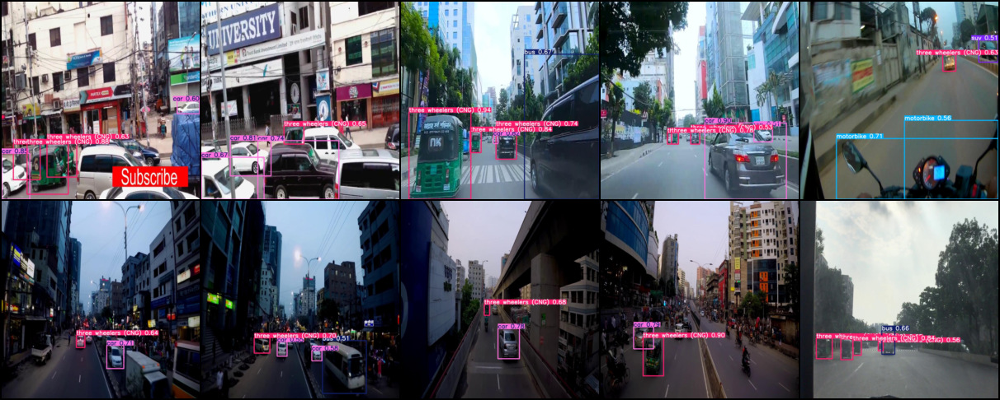

In [30]:
image = display_sample_images(yolo_custom_aug_images[0].save_dir, sample=10)
image

### 4.3 Training Performance Analysis (Augmented Custom Model)

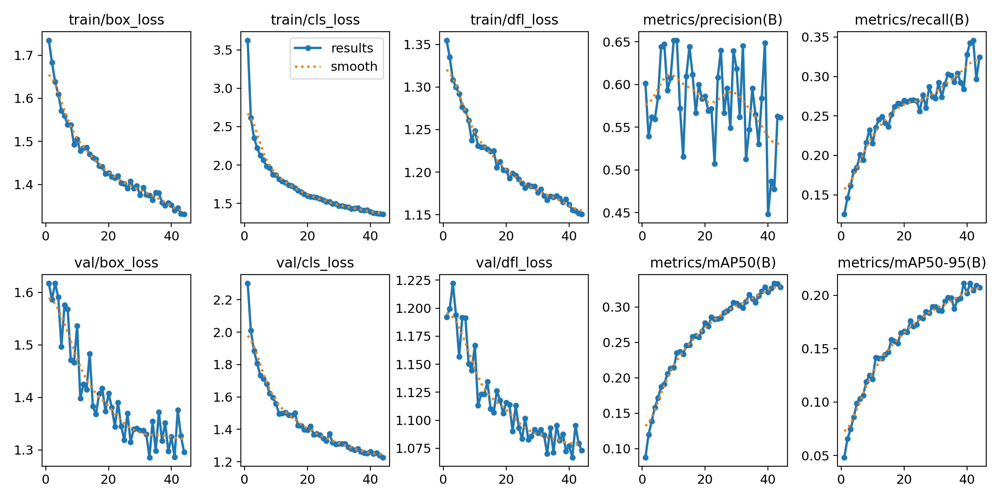

In [31]:
from IPython.display import Image
Image(filename='results_aug.png')

The augmented model exhibits more stable convergence, with training and validation losses decreasing smoothly, indicating better generalization. It shows lower final box_loss, indicating improved object localization, and a more stable classification process with decreased cls_loss. The precision-recall balance is more stable, with reduced fluctuations, leading to fewer false positives. Overall, the augmented model outperforms the custom model in terms of stability, precision, and overall performance, making it more suitable for real-world applications.

## 5. Using Best Model on Video Source

After evaluating the performance of each model, the Augmented Custom Model is used for real-time video source applications. This model offers superior stability, precision, and overall performance, making it the most reliable choice for real-time video detection tasks. 

In [32]:
video_path = Path("data_video", "dhaka_traffic.mp4")
Video(video_path)

In [33]:
with contextlib.redirect_stdout(None), contextlib.redirect_stderr(None):
    results_custom_aug_video = yolo_custom_aug.predict(
        video_path,
        conf=0.5,
        save=True,
        stream=True,
        project=Path("runs", "detect"),
        name="custom_aug_video",
        verbose=False,
        device=device
    )

In [34]:
for _ in tqdm(results_custom_aug_video, desc="Processing video frames", leave=False):
    pass

print("Video inference completed for baseline model.")

Processing video frames: 9332it [09:03, 17.99it/s]

Results saved to runs/detect/custom_aug_video
9047 labels saved to runs/detect/custom_aug_video/labels


Video inference completed for baseline model.


In [35]:
input_video = Path("runs/detect/custom_aug_video/dhaka_traffic.avi")
output_video = input_video.with_suffix(".mp4")  # Change extension to .mp4

# Run ffmpeg command to convert AVI to MP4, suppressing output
subprocess.run(
    ["ffmpeg", "-y", "-i", str(input_video), "-c:v", "libx264", "-preset", "fast", "-crf", "23", "-c:a", "aac", "-b:a", "128k", str(output_video)],
    stdout=subprocess.DEVNULL,
    stderr=subprocess.DEVNULL
)

print("Video conversion complete: dhaka_traffic.mp4")

Video conversion complete: dhaka_traffic.mp4


In [36]:
Video("runs/detect/custom_aug_video/dhaka_traffic.mp4")

## 6. Performance Comparison (Custom vs. Custom+Augmentation)

Now, we systematically compare the models based on key evaluation metrics. This will highlight the effectiveness of fine-tuning and data augmentation.

### 6.1 Confusion Matrices (Normalized) → visualization of misclassification trends


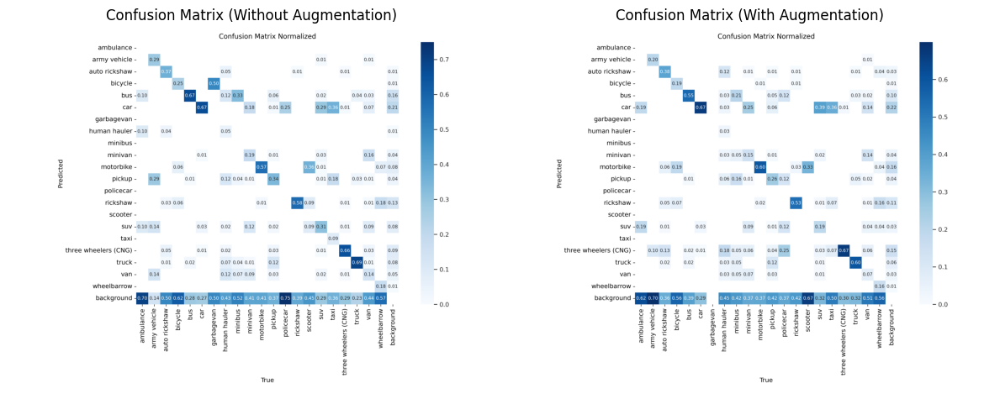

In [37]:
# Load images
img_no_aug = mpimg.imread("confusion_matrix_normalized.png")
img_aug = mpimg.imread("confusion_matrix_normalized_aug.png")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display the first image
axes[0].imshow(img_no_aug)
axes[0].set_title("Confusion Matrix (Without Augmentation)")
axes[0].axis('off')

# Display the second image
axes[1].imshow(img_aug)
axes[1].set_title("Confusion Matrix (With Augmentation)")
axes[1].axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


The normalized confusion matrices highlight key differences in classification performance between the custom-trained YOLO models with and without augmentation:
1. **Improved Background Discrimination:** The augmented model demonstrates better background filtering, reducing misclassifications from 62% to 70%.
2. **Rare Class Detection:** Classes like ambulances and wheelbarrows show improved detection accuracy in the augmented model, addressing class imbalance challenges.
3. **Persistent Confusions:** Despite improvements, confusion remains between visually similar classes, such as SUVs, minivans, and taxis.


### 6.2 Precision Curves → How precise the model is for each class

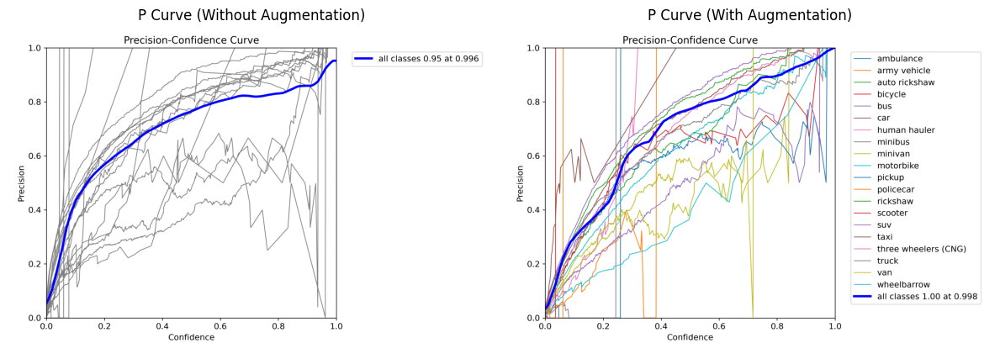

In [38]:
img_no_aug = mpimg.imread("P_curve.png")
img_aug = mpimg.imread("P_curve_aug.png")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_no_aug)
axes[0].set_title("P Curve (Without Augmentation)")
axes[0].axis('off')
axes[1].imshow(img_aug)
axes[1].set_title("P Curve (With Augmentation)")
axes[1].axis('off')
plt.tight_layout()
plt.show()


The precision curves reveal the augmented model's ability to achieve more consistent detection across confidence thresholds:
1. **Higher Initial Precision:** The augmented model starts with a higher precision (~0.82 vs. ~0.73 for the non-augmented model).
2. **Reduced False Positives:** A more gradual decline in precision indicates fewer false positives, critical for reliable traffic monitoring in Dhaka's congested conditions.
3. **Rare Class Benefits:** Augmentation improves precision for underrepresented classes like ambulances and police cars.



### 6.3 Recall Curve → Ability to detect all relevant objects per class

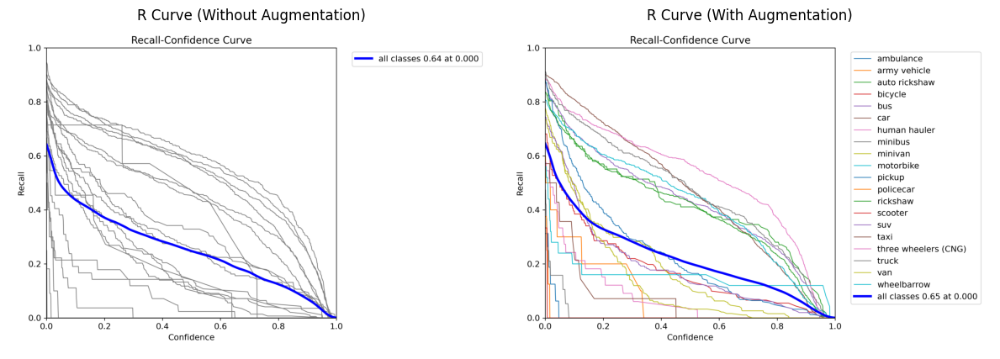

In [39]:
img_no_aug = mpimg.imread("R_curve.png")
img_aug = mpimg.imread("R_curve_aug.png")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_no_aug)
axes[0].set_title("R Curve (Without Augmentation)")
axes[0].axis('off')
axes[1].imshow(img_aug)
axes[1].set_title("R Curve (With Augmentation)")
axes[1].axis('off')
plt.tight_layout()
plt.show()


While both models start with similar overall recall values at a confidence of 0.0 (augmented: 0.65, non-augmented: 0.64), significant differences emerge at higher confidence levels:
1. **Improved Rare Class Recall:** The augmented model demonstrates increased recall for several classes like ambulances, auto rickshaws and buses.
2. **High Confidence Performance:** Specialized vehicles (ambulances, police cars) and smaller objects (scooters) continue to show poor recall in the non-augmented model.

### 6.4 Precision-Recall (PR) Curves → Shows trade-off between precision and recall

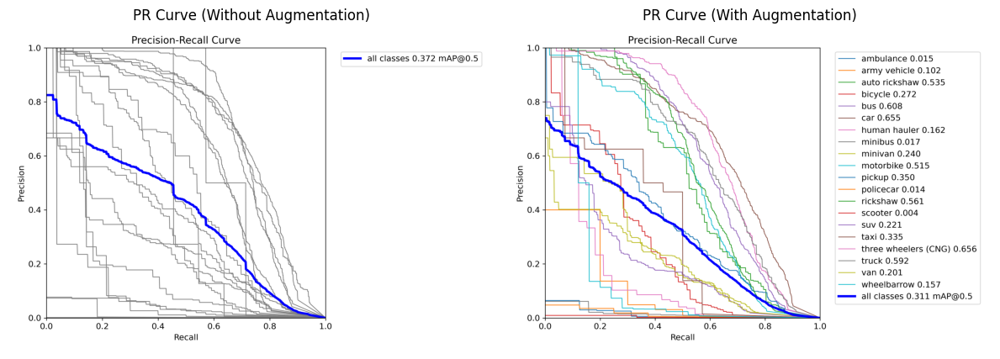

In [40]:
img_no_aug = mpimg.imread("PR_curve.png")
img_aug = mpimg.imread("PR_curve_aug.png")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_no_aug)
axes[0].set_title("PR Curve (Without Augmentation)")
axes[0].axis('off')
axes[1].imshow(img_aug)
axes[1].set_title("PR Curve (With Augmentation)")
axes[1].axis('off')
plt.tight_layout()
plt.show()


The precision-recall curves provide a class-specific breakdown of model performance:

1. **Class-Specific Trade-offs:** Augmentation improves PR curves for specific classes like ambulances, buses, and auto rickshaws, while some classes show minor suppression.

2. **Rare Class Insights:** Rare classes like army vehicles benefit from augmentation, which is not adequately represented by mAP alone.

3. **Threshold Optimization:** The curves help identify optimal confidence thresholds for balancing precision and recall.



### 6.5  F1 Curves → Balanced view of precision and recall for each class

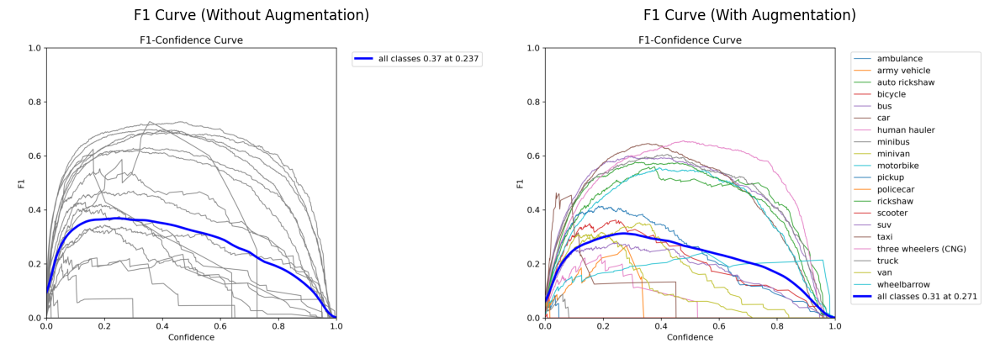

In [41]:
img_no_aug = mpimg.imread("F1_curve.png")
img_aug = mpimg.imread("F1_curve_aug.png")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_no_aug)
axes[0].set_title("F1 Curve (Without Augmentation)")
axes[0].axis('off')
axes[1].imshow(img_aug)
axes[1].set_title("F1 Curve (With Augmentation)")
axes[1].axis('off')  
plt.tight_layout()
plt.show()


The F1 curves highlight the balance between precision and recall at various confidence thresholds:
1. **Operating Point Comparison:** The non-augmented model peaks at an F1 score of 0.37 (confidence threshold: 0.237), while the augmented model peaks at 0.31 (confidence threshold: 0.271).
2. **Class-Specific Impact:** Augmentation improves F1 scores for certain classes (e.g., ambulances, bicycles, buses) while showing suppression for others.

## 7. Conclusion and Insights

Based on the detailed analysis, the following key insights were derived:

1. **Performance Across Models:**
- The augmented model demonstrated improved background discrimination and rare class detection (e.g., ambulances, police cars), addressing class imbalance challenges.
- However, the non-augmented model achieved higher overall mAP@0.5 and F1 scores, indicating better performance for common classes like cars and buses.

3. **Impact of Augmentation:**
- Augmentation enhanced recall and precision for rare classes such as ambulances and three-wheelers (CNG).
- Despite these improvements, augmentation slightly suppressed performance for certain frequent classes, highlighting trade-offs in balancing detection across all object categories.

4. **Class-Specific Observations:**
- The non-augmented model excelled in detecting common vehicles (e.g., cars, buses).
- The augmented model showed better consistency in detecting underrepresented classes like ambulances and pickups.

5. **Limitations & Future Work:**

- Both models struggled with occlusions and visually similar classes (e.g., SUVs vs. minivans).
- Improving recall for rare classes and optimizing augmentation strategies could further enhance detection reliability.
- Incorporating temporal tracking or ensemble methods may address persistent misclassifications and improve overall robustness.

In conclusion, while augmentation improved the model's ability to detect challenging objects, further refinements are necessary to balance performance across all classes and handle complex traffic scenarios effectively.

